# Loading and plotting data

This notebook showcases how to load and plot data that was previously generated using the `creator.py` script.

In [28]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [29]:
import xarray as xr
import matplotlib as mpl

from causaldynamics.scm import create_scm_graph
from causaldynamics.plot import animate_3d_trajectories, plot_trajectories, plot_scm


All relevant data is stored in a single dataset for easy access. Let's load it and look at the content:

In [30]:
# TODO: Update the path to the data
ds = xr.load_dataset("../output/20250509_174743/data/SLorenz_N5_T300_seedNone.nc")
ds

<xarray.Dataset> Size: 20kB
Dimensions:                   (time: 300, node: 5, dim: 3, node_in: 5,
                               node_out: 5, dim_in: 3, dim_out: 3)
Coordinates:
  * time                      (time) int32 1kB 0 1 2 3 4 ... 295 296 297 298 299
  * node_in                   (node_in) int32 20B 0 1 2 3 4
  * node_out                  (node_out) int32 20B 0 1 2 3 4
  * node                      (node) int32 20B 0 1 2 3 4
  * dim_in                    (dim_in) int32 12B 0 1 2
  * dim_out                   (dim_out) int32 12B 0 1 2
  * dim                       (dim) int32 12B 0 1 2
Data variables:
    time_series               (time, node, dim) float32 18kB -6.508 ... 22.82
    adjacency_matrix          (node_in, node_out) float32 100B 0.0 0.0 ... 0.0
    adjacency_matrix_summary  (node_in, node_out) float32 100B 0.0 0.0 ... 1.0
    weights                   (node, dim_in, dim_out) float32 180B -1.505 ......
    biases                    (node, dim) float32 60B 1.93 -0.2515 ... 0.07356
    magnitudes                (node) float32 20B 4.068 4.351 1.739 2.548 1.936
    root_nodes                (node) bool 5B False True True True True
    time_lag                  int32 4B 0

The data is stored in the `Data variables`. To get the data, e.g. the time_series, you can index it like a dictionary. 

In [31]:
time_series = ds["time_series"]
time_series 

<xarray.DataArray 'time_series' (time: 300, node: 5, dim: 3)> Size: 18kB
array([[[ -6.508157  , -11.142799  , -14.585829  ],
        [ -6.945636  , -10.672611  ,  14.572655  ],
        [ -8.055988  , -12.378771  ,  16.902288  ],
        [ -4.780242  ,  -7.3452835 ,  10.029437  ],
        [ -7.788247  , -11.9673605 ,  16.340538  ]],

       [[ -7.160615  , -12.032252  , -15.181925  ],
        [ -7.5566196 , -11.933698  ,  15.208826  ],
        [ -8.742972  , -13.528584  ,  17.843918  ],
        [ -5.225571  ,  -8.570252  ,  10.221717  ],
        [ -8.457464  , -13.152146  ,  17.203882  ]],

       [[ -7.865283  , -12.955656  , -15.82622   ],
        [ -8.260299  , -13.216196  ,  16.0786    ],
        [ -9.4917345 , -14.630083  ,  19.038092  ],
        [ -5.7864857 ,  -9.889438  ,  10.568987  ],
        [ -9.197122  , -14.307467  ,  18.317062  ]],

       ...,

       [[ 50.677544  ,  -4.1102676 ,  37.389927  ],
        [ 11.166326  ,  16.96171   ,  22.164518  ],
        [ -1.7224804 ,   6.0483527 ,  30.620579  ],
        [ -2.1112232 ,  -3.6342027 ,  13.226336  ],
        [  5.648906  ,   5.6372943 ,  23.667461  ]],

       [[ 50.287014  ,  -5.571171  ,  45.168587  ],
        [ 12.02152   ,  17.539698  ,  24.251036  ],
        [ -0.63945925,   5.9937167 ,  29.311707  ],
        [ -2.3553007 ,  -4.079322  ,  12.832733  ],
        [  5.668461  ,   5.938563  ,  23.21877   ]],

       [[ 49.508877  ,  -6.54055   ,  53.0927    ],
        [ 12.813437  ,  17.760881  ,  26.540382  ],
        [  0.28175008,   5.9072423 ,  28.14344   ],
        [ -2.6320734 ,  -4.5897694 ,  12.487015  ],
        [  5.72988   ,   6.2743044 ,  22.818031  ]]], dtype=float32)
Coordinates:
  * time     (time) int32 1kB 0 1 2 3 4 5 6 7 ... 293 294 295 296 297 298 299
  * node     (node) int32 20B 0 1 2 3 4
  * dim      (dim) int32 12B 0 1 2

Let's plot the time series.

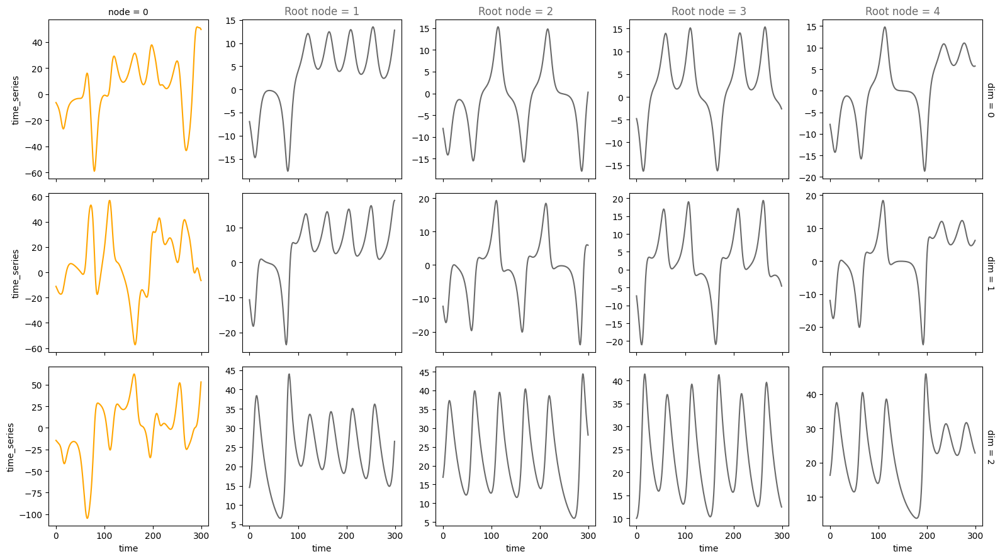

In [32]:
root_nodes = ds["root_nodes"]
plot_trajectories(time_series, root_nodes=root_nodes, sharey=False, node_color="orange", root_node_color="dimgrey")

The adjacency matrix encodes the SCM graph structure. The first dimension are the incoming nodes and the second dimension are the outgoing nodes.

In [33]:
A = ds["adjacency_matrix"]
A

<xarray.DataArray 'adjacency_matrix' (node_in: 5, node_out: 5)> Size: 100B
array([[0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.]], dtype=float32)
Coordinates:
  * node_in   (node_in) int32 20B 0 1 2 3 4
  * node_out  (node_out) int32 20B 0 1 2 3 4

There is also a summary graph that additionally encodes the temporal nodes from at the root nodes, which drive the system. 

Note: The `adjacency_matrix_summary` is especially relevant for causal discovery algorithms.

In [34]:
A_summary = ds["adjacency_matrix_summary"]
A_summary


<xarray.DataArray 'adjacency_matrix_summary' (node_in: 5, node_out: 5)> Size: 100B
array([[0., 0., 0., 0., 0.],
       [1., 1., 0., 0., 0.],
       [1., 0., 1., 0., 0.],
       [1., 0., 0., 1., 0.],
       [1., 0., 0., 0., 1.]], dtype=float32)
Coordinates:
  * node_in   (node_in) int32 20B 0 1 2 3 4
  * node_out  (node_out) int32 20B 0 1 2 3 4

In [35]:
# You can access the underlying numpy array directly by calling .data
print(A.data)
# You can also convert it to a pandas DataFrame
print(A.to_dataframe())

[[0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]]
                  adjacency_matrix
node_in node_out                  
0       0                      0.0
        1                      0.0
        2                      0.0
        3                      0.0
        4                      0.0
1       0                      1.0
        1                      0.0
        2                      0.0
        3                      0.0
        4                      0.0
2       0                      1.0
        1                      0.0
        2                      0.0
        3                      0.0
        4                      0.0
3       0                      1.0
        1                      0.0
        2                      0.0
        3                      0.0
        4                      0.0
4       0                      1.0
        1                      0.0
        2                      0.0
        3                      0.0

Let's visualize the graph

(<Axes: title={'center': 'Structural Causal Model'}>,
 {0: array([0.8812986, 0.9558141]),
  1: array([ 0.20354476, -0.10179732]),
  2: array([-0.94359961,  0.58761031]),
  3: array([-0.65000595, -0.4416271 ]),
  4: array([ 0.5087622, -1.       ])})

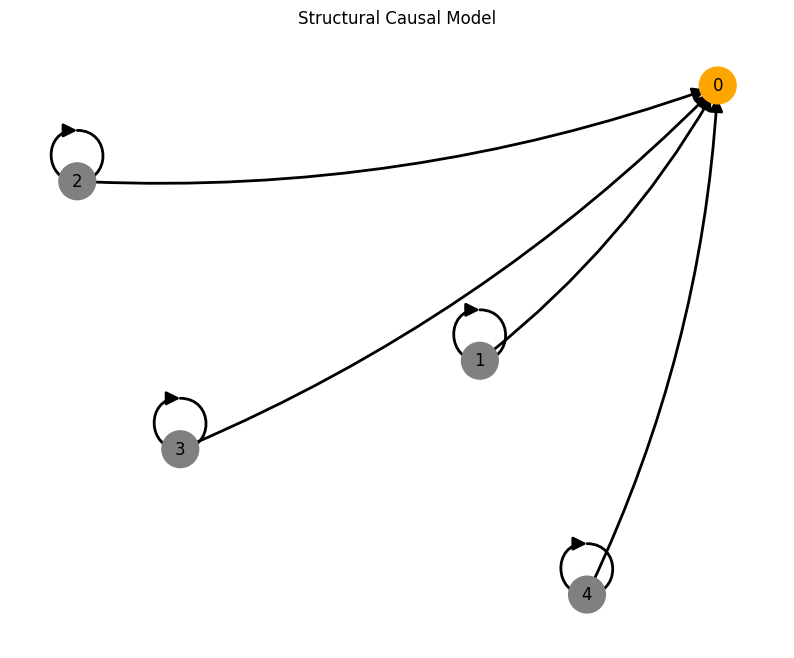

In [36]:
G = create_scm_graph(A.data)
plot_scm(G, root_nodes=root_nodes)


In [37]:
# Creating an animation of the trajectories. 
# This may take a while to run...
mpl.rcParams["animation.embed_limit"] = 50 * 1024**2  # Increase the limit to 50MB

animate_3d_trajectories(time_series, 
                        root_nodes=root_nodes, 
                        plot_type="subplots",
                        frame_skip=5, 
                        rotation_speed=0.2, 
                        rotate=True, 
                        show_history=True, 
                        save_path=None, 
                        return_html_anim=True, # perfect for use in notebooks :)
                        show_plot=False,
                        root_node_alpha=0.5,
                        node_alpha=0.5,
                        linewidth=1.5)